In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import random
from models import HybridLoss, HuggingFaceSegFormer, HuggingFaceBeit, HuggingFaceSwinUperNet
from etl_data import spine_dataset, load_data, split_data
from models import ImprovedAttentionUNet
from sched import scheduler
from torch.optim.lr_scheduler import ReduceLROnPlateau
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget
import math
import time
from tqdm import tqdm
from pytorch_grad_cam import GradCAM


/home/igor-lechoszest/anaconda3/envs/AI_Diag/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 0. HELPFUL FUNCTIONS

In [2]:
def evaluate_on_test_set(model, test_loader, device, num_classes=3, num_visualizations=5, force_rgb=False):
    """
    Calculates Dice, Recall, Precision, and Per-Class Accuracy.
    Visualizes 'num_visualizations' random samples from the test set.
    """
    model.eval()
    
    # Initialization of counters
    dice_scores = torch.zeros(num_classes).to(device)
    recall_scores = torch.zeros(num_classes).to(device)
    precision_scores = torch.zeros(num_classes).to(device)
    accuracy_scores = torch.zeros(num_classes).to(device)
    
    class_counts_true = torch.zeros(num_classes).to(device) 
    class_counts_pred = torch.zeros(num_classes).to(device)
    total_batches = 0
    
    # Class names
    class_names = ["Background", "Discs", "Vertebrae"]
    
    # List to store candidate images for visualization
    visual_candidates = []
    
    print("\n--- STARTING EVALUATION ON TEST SET ---")
    
    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(test_loader):
            images = images.to(device, dtype=torch.float32)
            masks = masks.to(device, dtype=torch.long)
            
            # --- POPRAWKA: KONWERSJA WARUNKOWA ---
            # Jeśli model wymaga RGB (force_rgb=True) i obraz jest szary -> konwertuj.
            if force_rgb and images.shape[1] == 1:
                images = images.repeat(1, 3, 1, 1)
            # -------------------------------------

            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            
            total_batches += 1
            
            # --- METRICS CALCULATION ---
            for cls in range(num_classes):
                pred_inds = (preds == cls)
                target_inds = (masks == cls)
                
                tp = (pred_inds & target_inds).float().sum()
                tn = ((~pred_inds) & (~target_inds)).float().sum()
                fp = (pred_inds & (~target_inds)).float().sum()
                fn = ((~pred_inds) & target_inds).float().sum()
                
                target_sum = tp + fn
                pred_sum = tp + fp
                total_pixels = tp + tn + fp + fn
                
                # Accuracy
                acc = (tp + tn) / (total_pixels + 1e-8)
                accuracy_scores[cls] += acc
                
                # Dice & Recall
                if target_sum > 0:
                    dice = (2. * tp) / (pred_sum + target_sum + 1e-8)
                    dice_scores[cls] += dice
                    recall = tp / (target_sum + 1e-8)
                    recall_scores[cls] += recall
                    class_counts_true[cls] += 1
                
                # Precision
                if pred_sum > 0:
                    precision = tp / (pred_sum + 1e-8)
                    precision_scores[cls] += precision
                    class_counts_pred[cls] += 1

            # --- VISUALIZATION COLLECTION LOGIC ---
            # Instead of taking the first N, we randomly pick candidates throughout the loop.
            # We collect a buffer of candidates (e.g., 3x more than needed) to choose from later.
            # random.random() < 0.15 gives a ~15% chance to pick a batch, spreading selection.
            if len(visual_candidates) < num_visualizations * 3 and random.random() < 0.15:
                # Take the first image from the current batch
                img_vis = images[0, 0].cpu().numpy() 
                mask_true_np = masks[0].cpu().numpy()
                mask_pred_np = preds[0].cpu().numpy()
                visual_candidates.append((img_vis, mask_true_np, mask_pred_np))

    # --- CALCULATING AVERAGES ---
    avg_accuracy = accuracy_scores / total_batches
    avg_dice = dice_scores / (class_counts_true + 1e-8)
    avg_recall = recall_scores / (class_counts_true + 1e-8)
    avg_precision = precision_scores / (class_counts_pred + 1e-8)

    # --- RESULTS REPORT ---
    print("\n" + "="*80)
    print(f"{'Class':<15} | {'Dice':<10} | {'Recall':<10} | {'Precision':<10} | {'Accuracy':<10}")
    print("-" * 80)
    
    for i in range(num_classes):
        print(f"{class_names[i]:<15} | {avg_dice[i].item():.4f}     | {avg_recall[i].item():.4f}     | {avg_precision[i].item():.4f}        | {avg_accuracy[i].item():.4f}")
    
    print("-" * 80)
    print(f"Mean Dice (Objects): {avg_dice[1:].mean().item():.4f}")
    print(f"Mean Accuracy (Objects): {avg_accuracy[1:].mean().item():.4f}")
    print(f"Mean Recall (Objects): {avg_recall[1:].mean().item():.4f}")
    print(f"Mean Precision (Objects): {avg_precision[1:].mean().item():.4f}")
    print("="*80)
    
    # --- RANDOM SELECTION & VISUALIZATION ---
    print(f"\nSelecting {num_visualizations} random samples for visualization...")
    
    # If we collected enough candidates, pick random ones. If not, take what we have.
    if len(visual_candidates) >= num_visualizations:
        final_samples = random.sample(visual_candidates, num_visualizations)
    else:
        final_samples = visual_candidates
        print(f"Warning: Only {len(final_samples)} candidates collected (increase probability or dataset size).")

    for i, (img, true_m, pred_m) in enumerate(final_samples):
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle(f'Random Test Sample #{i+1}', fontsize=16)
        
        ax[0].imshow(img, cmap='gray')
        ax[0].set_title("MRI (Input)")
        ax[0].axis('off')
        
        # vmax=2 ensures correct color mapping for classes 0, 1, 2
        ax[1].imshow(true_m, cmap='jet', vmin=0, vmax=2)
        ax[1].set_title("Ground Truth")
        ax[1].axis('off')
        
        ax[2].imshow(pred_m, cmap='jet', vmin=0, vmax=2)
        ax[2].set_title(f"Model Prediction")
        ax[2].axis('off')
        
        plt.tight_layout()
        plt.show()

In [3]:
def data_loading_for_model():
    print("Wczytywanie i dzielenie danych...")
    imgs, masks, types = load_data()

    train_imgs, train_masks, train_types, val_imgs, val_masks, val_types, test_imgs, test_masks, test_types = split_data(imgs, masks, types, train_frac=0.7, val_frac=0.2, seed=2026)
        
    train_ds = spine_dataset(train_imgs, train_masks, train_types, train=True)
    val_ds   = spine_dataset(val_imgs, val_masks, val_types, train=False)
    test_ds  = spine_dataset(test_imgs, test_masks, test_types, train=False)
    
    print(f"Dane podzielone:")
    print(f"  -> Trening:   {len(train_ds)} (70%)")
    print(f"  -> Walidacja: {len(val_ds)} (20%)")
    print(f"  -> Test:      {len(test_ds)} (10%)")

    # DataLoader'y
    batch_size = 8
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=True)
    test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=0, pin_memory=True) # Batch 1 dla testu jest wygodniejszy

    return train_loader, val_loader, test_loader

# 1. PAPER MODEL

Wczytywanie i dzielenie danych...
Dane podzielone:
  -> Trening:   5080 (70%)
  -> Walidacja: 1474 (20%)
  -> Test:      763 (10%)

--- STARTING EVALUATION ON TEST SET ---

Class           | Dice       | Recall     | Precision  | Accuracy  
--------------------------------------------------------------------------------
Background      | 0.9965     | 0.9969     | 0.9961        | 0.9936
Discs           | 0.8582     | 0.8468     | 0.8462        | 0.9946
Vertebrae       | 0.8542     | 0.8755     | 0.8445        | 0.9982
--------------------------------------------------------------------------------
Mean Dice (Objects): 0.8562
Mean Accuracy (Objects): 0.9964
Mean Recall (Objects): 0.8611
Mean Precision (Objects): 0.8453

Selecting 1 random samples for visualization...


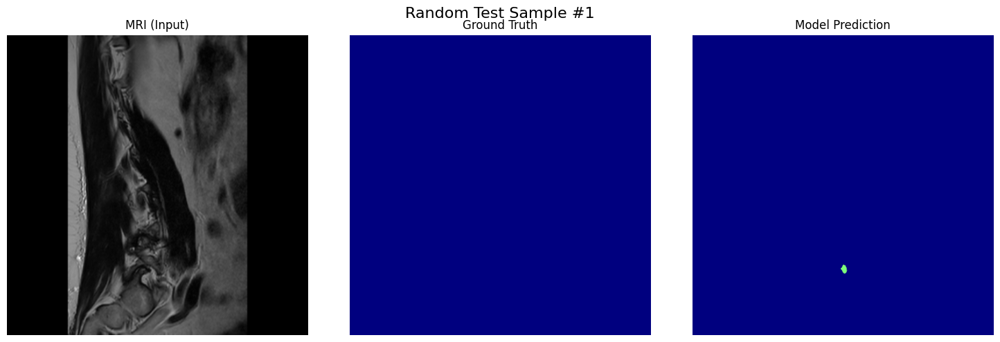

In [ ]:
test_loader = data_loading_for_model()[2]
model = ImprovedAttentionUNet(img_ch=1, output_ch=3).to('cuda')
model.load_state_dict(torch.load("trained_3d_models/best_paper_model.pth"))
evaluate_on_test_set(model, test_loader, 'cuda', num_classes=3, num_visualizations=1, force_rgb=False)

# 2. TRANSFORMERS

In [ ]:
def TransferLearning_model(model_type="segformer", model_name="nvidia/mit-b0"):
    """
    model_type: 'segformer', 'swin', or 'beit'
    model_name: name from HuggingFace Hub
    """
    print(f"--- START TRANSFER LEARNING: Type={model_type}, Name={model_name} ---")
    
    # 1. Configuration
    if torch.cuda.is_available():
        device = torch.device('cuda')
    elif torch.backends.mps.is_available():
        device = torch.device('mps')
    else:
        device = torch.device('cpu')

    # 2. Data
    train_loader, val_loader, test_loader = data_loading_for_model()

    # 3. Model Selection
    # CHANGE 1: Hardcoded to 3 classes (Background, Discs, Vertebrae)
    num_classes = 3 
    
    # Model initialization
    if model_type == "segformer":
        model = HuggingFaceSegFormer(num_classes=num_classes, model_name=model_name).to(device)
    elif model_type == "swin":
        model = HuggingFaceSwinUperNet(num_classes=num_classes, model_name=model_name).to(device)
    elif model_type == "beit":
        model = HuggingFaceBeit(num_classes=num_classes, model_name=model_name).to(device)
    else:
        raise ValueError(f"Unknown model type: {model_type}")

    criterion = HybridLoss().to(device)
    optimizer = optim.Adam(model.parameters(), lr=5e-5)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    
    num_epochs = 10
    best_val_loss = float('inf')
    
    # NEW: Lists for training history
    train_history = []
    val_history = []
    
    safe_name = model_name.replace('/', '_').replace('-', '_')
    save_name = f"best_{model_type}_{safe_name}.pth"
    
    print(f"Starting training. Model will be saved as: {save_name}")
    
    # --- TRAINING LOOP ---
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        train_loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", leave=False)

        for images, masks in train_loop:
            images = images.to(device, dtype=torch.float32)
            masks = masks.to(device, dtype=torch.long)
            
            optimizer.zero_grad()
            outputs = model(images) # Model sam sobie poradzi z konwersją
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            train_loop.set_postfix(loss=loss.item())
            
        avg_train_loss = train_loss / len(train_loader)
        
        # Validation
        model.eval()
        val_loss = 0
        val_loop = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]", leave=False)
        
        with torch.no_grad():
            for images, masks in val_loop:
                images = images.to(device, dtype=torch.float32)
                masks = masks.to(device, dtype=torch.long)
                    
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_loop.set_postfix(loss=loss.item())    
        
        avg_val_loss = val_loss / len(val_loader)
        
        # Save to history
        train_history.append(avg_train_loss)
        val_history.append(avg_val_loss)
        
        scheduler.step(avg_val_loss)
        current_lr = optimizer.param_groups[0]['lr']
        
        print(f"Epoch [{epoch+1}/{num_epochs}] | LR: {current_lr:.2e} | Train: {avg_train_loss:.4f} | Val: {avg_val_loss:.4f}")
        
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), save_name)

    print(f"\nTraining {model_type} finished.")

    # NEW: Plotting the graph
    plt.figure(figsize=(10, 6))
    plt.plot(train_history, label='Train Loss', color='blue')
    plt.plot(val_history, label='Validation Loss', color='orange')
    plt.title(f'Learning Curve: {model_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    print("Testing...")
    
    # 4. Testing
    model.load_state_dict(torch.load(save_name))
    
    # Pass num_classes=3 to the testing function
    evaluate_on_test_set(model, test_loader, device, num_classes)
    
    torch.cuda.empty_cache() 

    return model

In [5]:
tl_model = TransferLearning_model(model_type="segformer", model_name="nvidia/mit-b0")

--- START TRANSFER LEARNING: Type=segformer, Name=nvidia/mit-b0 ---
Wczytywanie i dzielenie danych...
Dane podzielone:
  -> Trening:   5080 (70%)
  -> Walidacja: 1474 (20%)
  -> Test:      763 (10%)


Loading weights: 100%|██████████| 192/192 [00:00<00:00, 1968.14it/s, Materializing param=segformer.encoder.patch_embeddings.3.proj.weight]            
SegformerForSemanticSegmentation LOAD REPORT from: nvidia/mit-b0
Key                                           | Status     | 
----------------------------------------------+------------+-
classifier.weight                             | UNEXPECTED | 
classifier.bias                               | UNEXPECTED | 
decode_head.linear_fuse.weight                | MISSING    | 
decode_head.linear_c.{0, 1, 2, 3}.proj.bias   | MISSING    | 
decode_head.classifier.weight                 | MISSING    | 
decode_head.linear_c.{0, 1, 2, 3}.proj.weight | MISSING    | 
decode_head.batch_norm.running_var            | MISSING    | 
decode_head.batch_norm.running_mean           | MISSING    | 
decode_head.batch_norm.num_batches_tracked    | MISSING    | 
decode_head.batch_norm.weight                 | MISSING    | 
decode_head.classifier.bias             

Starting training with Mixed Precision (AMP). Save name: best_segformer_nvidia_mit_b0.pth


KeyboardInterrupt: 

Wczytywanie i dzielenie danych...
Dane podzielone:
  -> Trening:   5080 (70%)
  -> Walidacja: 1474 (20%)
  -> Test:      763 (10%)


Loading weights: 100%|██████████| 192/192 [00:00<00:00, 2244.94it/s, Materializing param=segformer.encoder.patch_embeddings.3.proj.weight]            
SegformerForSemanticSegmentation LOAD REPORT from: nvidia/mit-b0
Key                                           | Status     | 
----------------------------------------------+------------+-
classifier.weight                             | UNEXPECTED | 
classifier.bias                               | UNEXPECTED | 
decode_head.linear_c.{0, 1, 2, 3}.proj.weight | MISSING    | 
decode_head.batch_norm.bias                   | MISSING    | 
decode_head.batch_norm.running_var            | MISSING    | 
decode_head.batch_norm.num_batches_tracked    | MISSING    | 
decode_head.classifier.weight                 | MISSING    | 
decode_head.classifier.bias                   | MISSING    | 
decode_head.linear_fuse.weight                | MISSING    | 
decode_head.batch_norm.running_mean           | MISSING    | 
decode_head.batch_norm.weight           


--- STARTING EVALUATION ON TEST SET ---

Class           | Dice       | Recall     | Precision  | Accuracy  
--------------------------------------------------------------------------------
Background      | 0.9885     | 0.9875     | 0.9896        | 0.9788
Discs           | 0.5447     | 0.5566     | 0.6161        | 0.9816
Vertebrae       | 0.6750     | 0.8066     | 0.5759        | 0.9942
--------------------------------------------------------------------------------
Mean Dice (Objects): 0.6099
Mean Accuracy (Objects): 0.9879
Mean Recall (Objects): 0.6816
Mean Precision (Objects): 0.5960

Selecting 5 random samples for visualization...


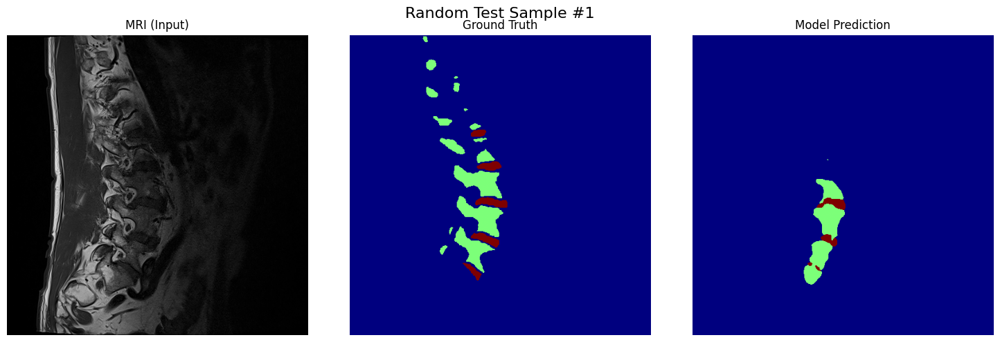

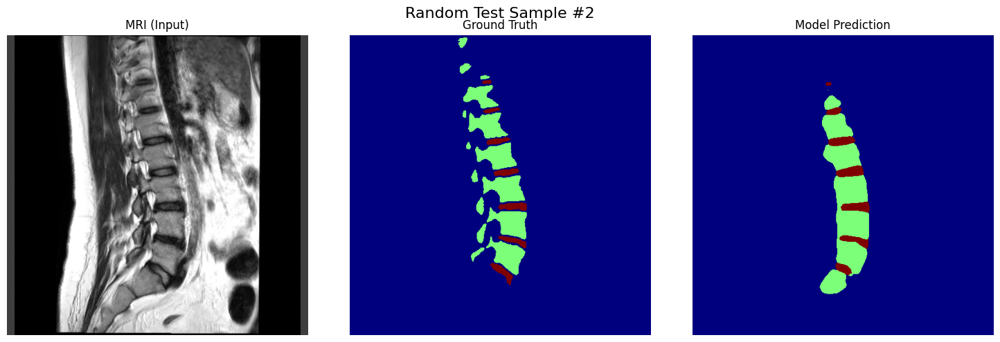

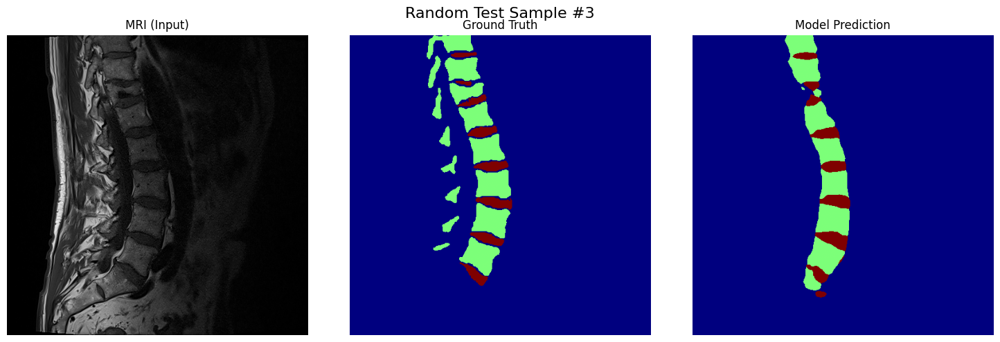

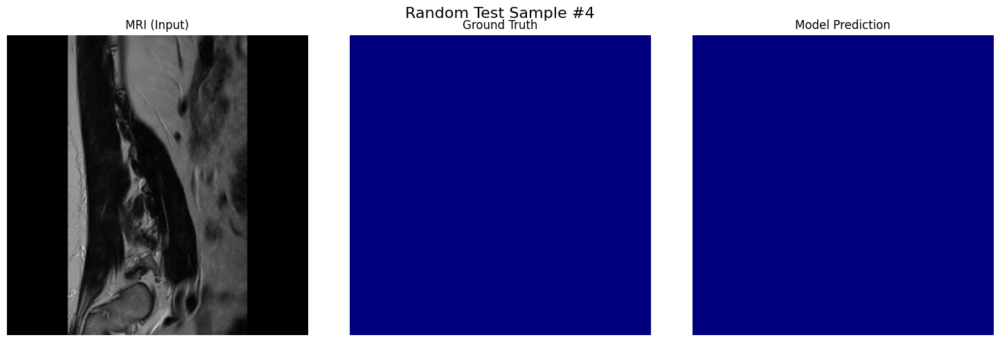

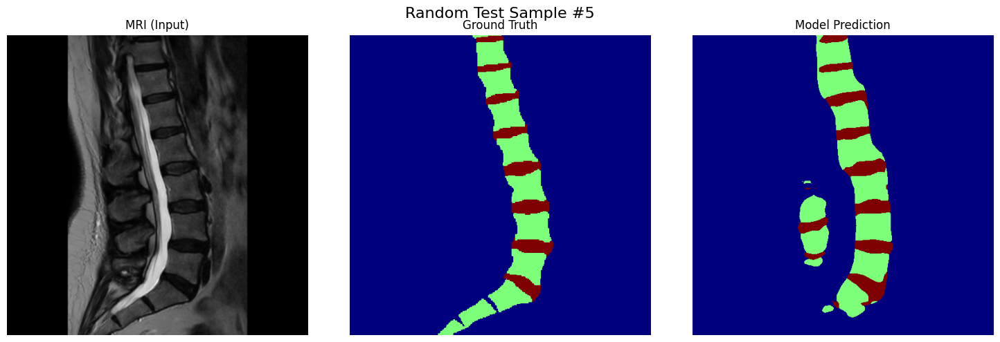

In [4]:
test_loader = data_loading_for_model()[2]
model = HuggingFaceSegFormer(num_classes=3, model_name="nvidia/mit-b0").to('cuda')
model.load_state_dict(torch.load("best_segformer_nvidia_mit_b0.pth"))
evaluate_on_test_set(model, test_loader, 'cuda', 3)

In [5]:
tl_model = TransferLearning_model(model_type="swin", model_name="openmmlab/upernet-swin-tiny")

--- START TRANSFER LEARNING: Type=swin, Name=openmmlab/upernet-swin-tiny ---
Wczytywanie i dzielenie danych...
Dane podzielone:
  -> Trening:   5080 (70%)
  -> Walidacja: 1474 (20%)
  -> Test:      763 (10%)


Loading weights: 100%|██████████| 319/319 [00:00<00:00, 1686.86it/s, Materializing param=decode_head.psp_modules.3.1.conv.weight]                                       
UperNetForSemanticSegmentation LOAD REPORT from: openmmlab/upernet-swin-tiny
Key                              | Status   |                                                                                                   
---------------------------------+----------+---------------------------------------------------------------------------------------------------
auxiliary_head.classifier.weight | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150, 256, 1, 1]) vs model:torch.Size([3, 256, 1, 1])
decode_head.classifier.bias      | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
auxiliary_head.classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
decode_head.classifier.weight

Starting training. Model will be saved as: best_swin_openmmlab_upernet_swin_tiny.pth


Epoch [1/10] | LR: 5.00e-05 | Train: 0.3920 | Val: 0.2556


Epoch [2/10] | LR: 5.00e-05 | Train: 0.2534 | Val: 0.2311


Epoch [3/10] | LR: 5.00e-05 | Train: 0.2388 | Val: 0.2265


Epoch [4/10] | LR: 5.00e-05 | Train: 0.2300 | Val: 0.2223


KeyboardInterrupt: 

Wczytywanie i dzielenie danych...
Dane podzielone:
  -> Trening:   5080 (70%)
  -> Walidacja: 1474 (20%)
  -> Test:      763 (10%)


Loading weights: 100%|██████████| 319/319 [00:00<00:00, 1967.80it/s, Materializing param=decode_head.psp_modules.3.1.conv.weight]                                       
UperNetForSemanticSegmentation LOAD REPORT from: openmmlab/upernet-swin-tiny
Key                              | Status   |                                                                                                   
---------------------------------+----------+---------------------------------------------------------------------------------------------------
auxiliary_head.classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
decode_head.classifier.weight    | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150, 512, 1, 1]) vs model:torch.Size([3, 512, 1, 1])
auxiliary_head.classifier.weight | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150, 256, 1, 1]) vs model:torch.Size([3, 256, 1, 1])
decode_head.classifier.bias  


--- STARTING EVALUATION ON TEST SET ---

Class           | Dice       | Recall     | Precision  | Accuracy  
--------------------------------------------------------------------------------
Background      | 0.9960     | 0.9970     | 0.9950        | 0.9925
Discs           | 0.8346     | 0.8241     | 0.8529        | 0.9936
Vertebrae       | 0.8348     | 0.8154     | 0.8561        | 0.9977
--------------------------------------------------------------------------------
Mean Dice (Objects): 0.8347
Mean Accuracy (Objects): 0.9957
Mean Recall (Objects): 0.8198
Mean Precision (Objects): 0.8545

Selecting 5 random samples for visualization...


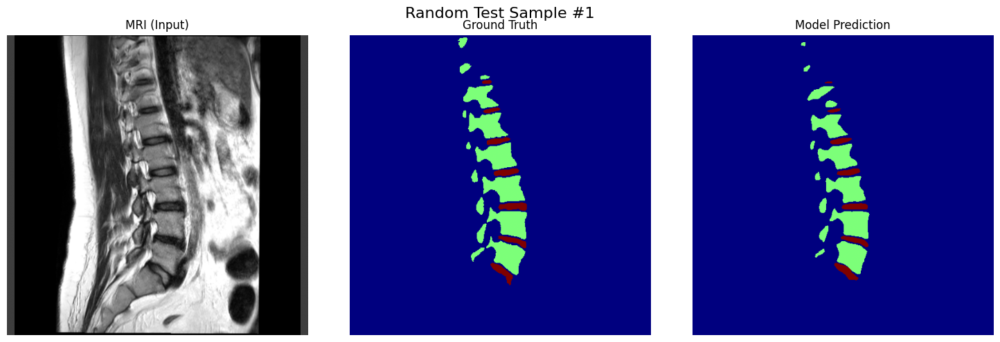

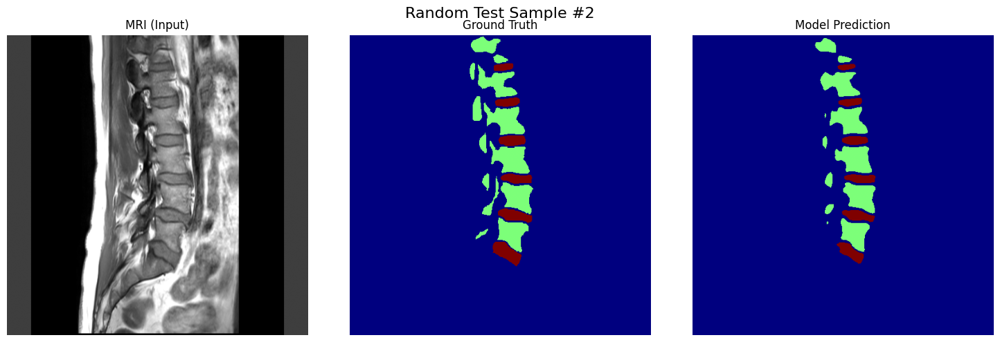

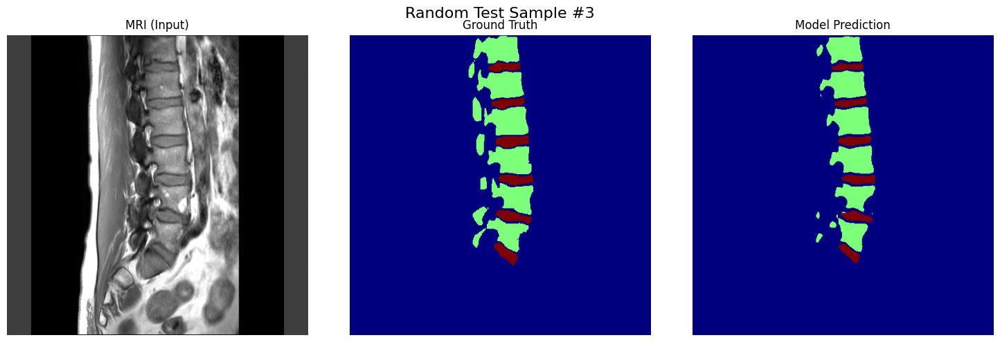

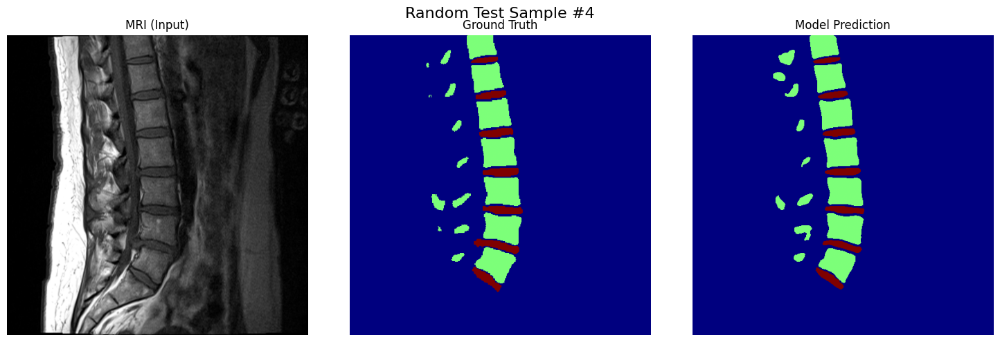

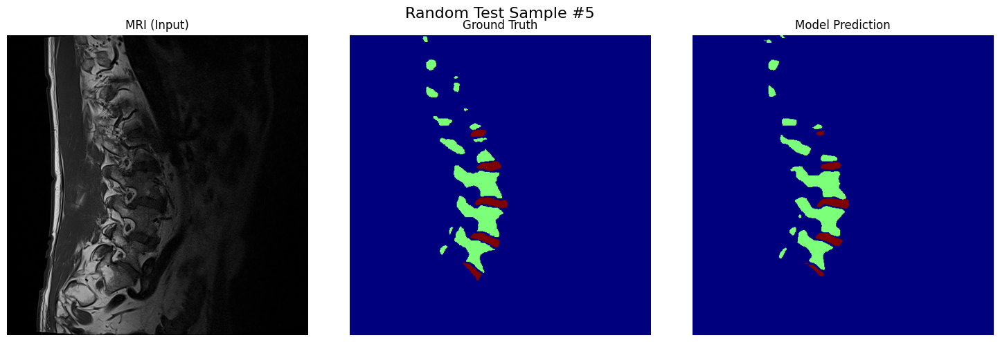

In [4]:
test_loader = data_loading_for_model()[2]
model = HuggingFaceSwinUperNet(num_classes=3, model_name="openmmlab/upernet-swin-tiny").to('cuda')
model.load_state_dict(torch.load("best_swin_openmmlab_upernet_swin_tiny.pth"))
evaluate_on_test_set(model, test_loader, 'cuda', 3)

# 3. VIZUALIZATIONS

In [4]:
device = 'cuda'
test_loader = data_loading_for_model()[2]
# 1. Pobierz jeden obraz z loadera
#images, masks = next(iter(test_loader))
#image = images[0:1].to(device) # Bierzemy pierwszy obraz, zachowując batch dim [1, 1, 512, 512]
classes_map = {
    2: "IVD",
    1: "Vertebrae"
}

Wczytywanie i dzielenie danych...
Dane podzielone:
  -> Trening:   5080 (70%)
  -> Walidacja: 1474 (20%)
  -> Test:      763 (10%)


In [5]:
def swin_reshape_transform(tensor):
    """
    Zamienia wyjście Swin Transformer (3D lub 4D channels-last) 
    na standardowy format CNN (4D channels-first).
    """
    # Sprawdzamy wymiary
    # Przypadek A: Tensor jest 3D [Batch, Sequence_Length, Channels]
    if tensor.ndim == 3:
        B, L, C = tensor.shape
        # Zakładamy kwadratowy obrazek (H = W = sqrt(L))
        H = W = int(math.sqrt(L))
        
        # 1. Rozwijamy sekwencję w obrazek 2D: [B, H, W, C]
        result = tensor.reshape(B, H, W, C)
        
        # 2. Zamieniamy kanały (Channels-Last -> Channels-First): [B, C, H, W]
        result = result.permute(0, 3, 1, 2)
        return result

    # Przypadek B: Tensor jest już 4D, ale w formacie [B, H, W, C] (Swin często tak ma)
    elif tensor.ndim == 4:
        # Po prostu zamieniamy kanały na początek: [B, C, H, W]
        return tensor.permute(0, 3, 1, 2)

    # Inne przypadki (nie powinny wystąpić)
    return tensor

In [ ]:
def visualize_gradcam_grid(model, test_loader, target_layers, classes_to_show, num_samples=3, reshape_transform=None):
    """
    Dodano parametr reshape_transform dla modeli Transformer (Swin, ViT).
    """
    model.eval()
    
    # Włączamy gradienty
    for param in model.parameters():
        param.requires_grad = True

    device = next(model.parameters()).device
    visual_candidates = []
    
    print(f"Collecting random samples for GradCAM (Target: {num_samples})...")
    
    # 1. Zbieranie kandydatów (z losowaniem)
    for batch_idx, (images, masks) in enumerate(test_loader):
        if random.random() < 0.20:
            
            img_tensor = images[0:1]
            visual_candidates.append(img_tensor)
            
        if len(visual_candidates) >= num_samples * 3:
            break

    # 2. Selekcja
    if len(visual_candidates) == 0:
        # Fallback: weź pierwszy batch jak nic nie wylosowało
        images, _ = next(iter(test_loader))
        visual_candidates.append(images[0:1])

    if len(visual_candidates) < num_samples:
        final_samples = visual_candidates
        num_samples = len(final_samples)
    else:
        final_samples = random.sample(visual_candidates, num_samples)

    # 3. Przygotowanie wykresu
    num_classes = len(classes_to_show)
    fig, axes = plt.subplots(nrows=num_samples, ncols=num_classes + 1, figsize=(4 * (num_classes + 1), 4 * num_samples))
    if num_samples == 1: axes = axes[None, :]

    # --- INICJALIZACJA GRAD-CAM Z RESHAPE TRANSFORM ---
    cam = GradCAM(
        model=model, 
        target_layers=target_layers, 
        reshape_transform=reshape_transform  # <--- TUTAJ KLUCZOWA ZMIANA
    )
    # --------------------------------------------------

    print("Generating Heatmaps...")
    for i, img_tensor in enumerate(final_samples):
        img_tensor = img_tensor.to(device)
        
        # Tło
        img_bg = img_tensor.detach().cpu().numpy()[0, 0]
        if img_bg.max() - img_bg.min() != 0:
            img_bg_norm = (img_bg - img_bg.min()) / (img_bg.max() - img_bg.min())
        else:
            img_bg_norm = img_bg
        img_bg_rgb = np.stack([img_bg_norm]*3, axis=-1)

        axes[i, 0].imshow(img_bg_norm, cmap='gray')
        axes[i, 0].set_title(f"Sample {i+1}: Original")
        axes[i, 0].axis('off')

        # Klasy
        for col_idx, (class_id, class_name) in enumerate(classes_to_show.items()):
            mask = np.ones((img_tensor.shape[-2], img_tensor.shape[-1]), dtype=np.float32)
            targets = [SemanticSegmentationTarget(category=class_id, mask=mask)]
            
            grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0, :]
            visualization = show_cam_on_image(img_bg_rgb, grayscale_cam, use_rgb=True)
            
            ax = axes[i, col_idx + 1]
            ax.imshow(visualization)
            ax.set_title(f"{class_name}")
            ax.axis('off')

    plt.tight_layout()
    plt.show()

ImprovedAttentionUNet


>>> Generowanie Grad-CAM dla Improved Attention U-Net <<<
Generating Heatmaps...


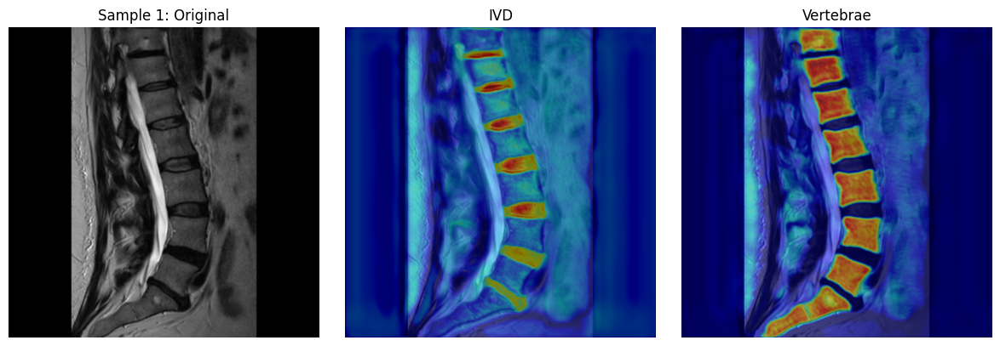

In [22]:
# ==========================================
# PRZYKŁAD 4: Grad-CAM dla Attention U-Net
# ==========================================
print("\n>>> Generowanie Grad-CAM dla Improved Attention U-Net <<<")

# 1. Inicjalizacja modelu
unet_model = ImprovedAttentionUNet(img_ch=1, output_ch=3).to('cuda')

# 2. Ładowanie wag
# SPRAWDŹ CZY NAZWA PLIKU JEST POPRAWNA (zazwyczaj nazywaliśmy go tak jak poniżej)
unet_model.load_state_dict(torch.load("trained_3d_models/best_paper_model.pth"))

# 3. Wybór warstwy docelowej
# Celujemy w ostatni konwolucyjny blok residualny w dekoderze
# To daje lepszy wgląd niż sama warstwa wyjściowa (conv_final)
target_layer_unet = [unet_model.up_res2.conv2]

# 4. Wizualizacja
visualize_gradcam_grid(
    model=unet_model,
    test_loader=test_loader,
    target_layers=target_layer_unet,
    classes_to_show=classes_map,
    num_samples=1
)

Swin UperNet 


>>> Generowanie Grad-CAM dla Swin UperNet <<<


Loading weights: 100%|██████████| 319/319 [00:00<00:00, 2023.51it/s, Materializing param=decode_head.psp_modules.3.1.conv.weight]                                       
UperNetForSemanticSegmentation LOAD REPORT from: openmmlab/upernet-swin-tiny
Key                              | Status   |                                                                                                   
---------------------------------+----------+---------------------------------------------------------------------------------------------------
auxiliary_head.classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
decode_head.classifier.weight    | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150, 512, 1, 1]) vs model:torch.Size([3, 512, 1, 1])
decode_head.classifier.bias      | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
auxiliary_head.classifier.wei

Generating Heatmaps...


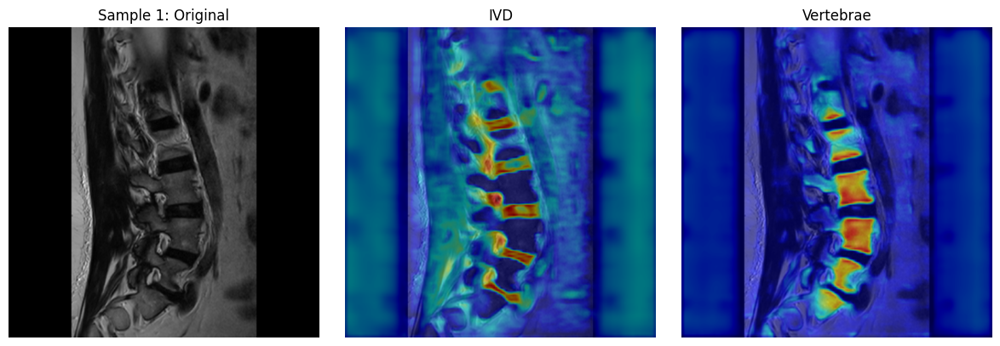

In [ ]:
# ==========================================
# PRZYKŁAD 3: Grad-CAM dla Swin UperNet 
# ==========================================
print("\n>>> Generowanie Grad-CAM dla Swin UperNet <<<")

swin_model = HuggingFaceSwinUperNet(num_classes=3, model_name="openmmlab/upernet-swin-tiny").to(device)

swin_model.load_state_dict(torch.load("best_swin_openmmlab_upernet_swin_tiny.pth"))

target_layer_fusion = [swin_model.model.decode_head.fpn_bottleneck.conv]

visualize_gradcam_grid(
    model=swin_model,
    test_loader=test_loader,
    target_layers=target_layer_fusion,
    classes_to_show=classes_map,
    num_samples=1,
    reshape_transform=None  # <-- To jest zwykłe CNN
)


>>> Generowanie Grad-CAM dla Swin UperNet <<<


Loading weights: 100%|██████████| 319/319 [00:00<00:00, 2055.62it/s, Materializing param=decode_head.psp_modules.3.1.conv.weight]                                       
UperNetForSemanticSegmentation LOAD REPORT from: openmmlab/upernet-swin-tiny
Key                              | Status   |                                                                                                   
---------------------------------+----------+---------------------------------------------------------------------------------------------------
auxiliary_head.classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
decode_head.classifier.weight    | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150, 512, 1, 1]) vs model:torch.Size([3, 512, 1, 1])
decode_head.classifier.bias      | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
auxiliary_head.classifier.wei

Generating Heatmaps...


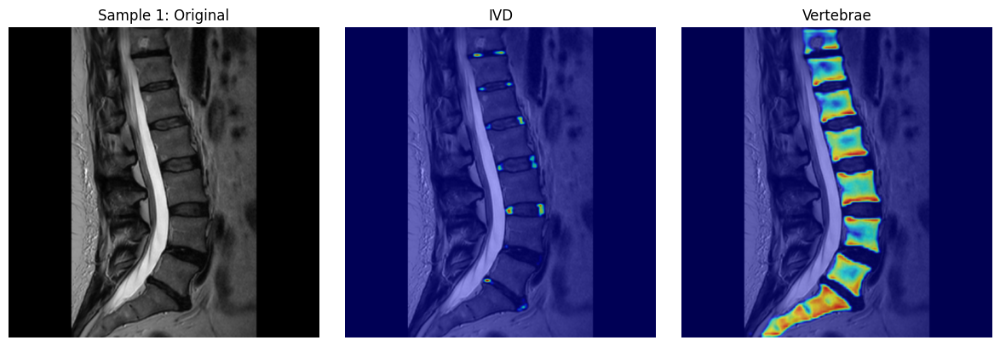

In [ ]:
print("\n>>> Generowanie Grad-CAM dla Swin UperNet <<<")

swin_model = HuggingFaceSwinUperNet(num_classes=3, model_name="openmmlab/upernet-swin-tiny").to(device)

swin_model.load_state_dict(torch.load("best_swin_openmmlab_upernet_swin_tiny.pth"))

target_layer_decoder = [swin_model.model.decode_head.classifier]

# 4. Wizualizacja
visualize_gradcam_grid(
    model=swin_model,
    test_loader=test_loader,
    target_layers=target_layer_decoder,
    classes_to_show=classes_map,
    num_samples=1,
    reshape_transform=None 
)


>>> Generowanie Grad-CAM dla Swin UperNet <<<


Loading weights: 100%|██████████| 319/319 [00:00<00:00, 1957.59it/s, Materializing param=decode_head.psp_modules.3.1.conv.weight]                                       
UperNetForSemanticSegmentation LOAD REPORT from: openmmlab/upernet-swin-tiny
Key                              | Status   |                                                                                                   
---------------------------------+----------+---------------------------------------------------------------------------------------------------
auxiliary_head.classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
decode_head.classifier.weight    | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150, 512, 1, 1]) vs model:torch.Size([3, 512, 1, 1])
decode_head.classifier.bias      | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
auxiliary_head.classifier.wei

Generating Heatmaps...


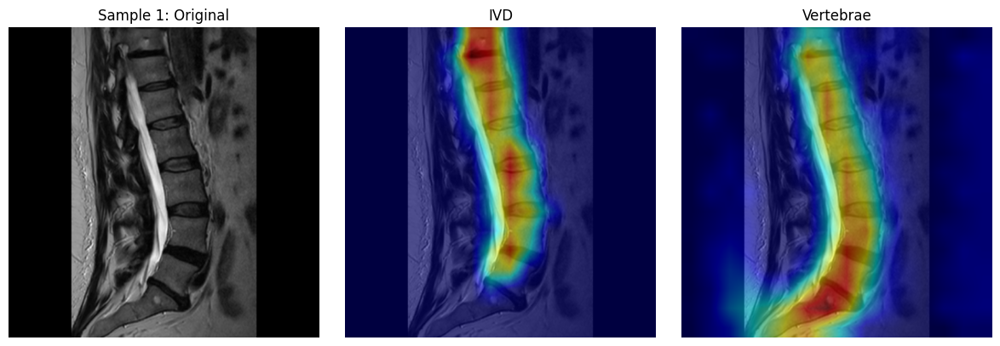

In [25]:
print("\n>>> Generowanie Grad-CAM dla Swin UperNet <<<")

swin_model = HuggingFaceSwinUperNet(num_classes=3, model_name="openmmlab/upernet-swin-tiny").to(device)

swin_model.load_state_dict(torch.load("best_swin_openmmlab_upernet_swin_tiny.pth"))

target_layer_global = [swin_model.model.decode_head.bottleneck.conv]

# 4. Wizualizacja
visualize_gradcam_grid(
    model=swin_model,
    test_loader=test_loader,
    target_layers=target_layer_global,
    classes_to_show=classes_map,
    num_samples=1,
    reshape_transform=None 
)


>>> Generowanie Grad-CAM dla Swin UperNet <<<


Loading weights: 100%|██████████| 319/319 [00:00<00:00, 1991.79it/s, Materializing param=decode_head.psp_modules.3.1.conv.weight]                                       
UperNetForSemanticSegmentation LOAD REPORT from: openmmlab/upernet-swin-tiny
Key                              | Status   |                                                                                                   
---------------------------------+----------+---------------------------------------------------------------------------------------------------
auxiliary_head.classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
decode_head.classifier.weight    | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150, 512, 1, 1]) vs model:torch.Size([3, 512, 1, 1])
decode_head.classifier.bias      | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([150]) vs model:torch.Size([3])                      
auxiliary_head.classifier.wei

Generating Heatmaps...


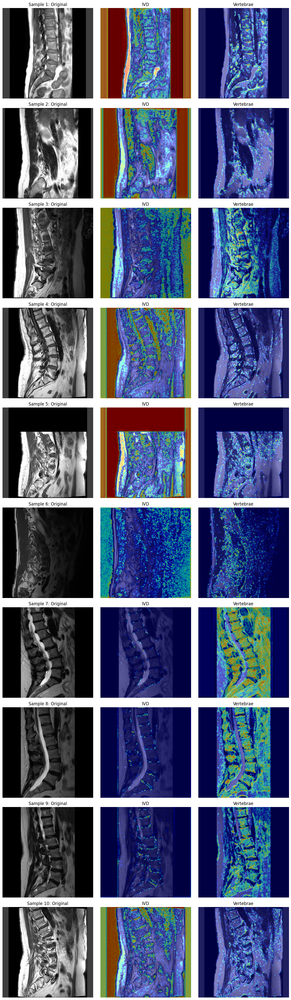

In [27]:
print("\n>>> Generowanie Grad-CAM dla Swin UperNet <<<")

swin_model = HuggingFaceSwinUperNet(num_classes=3, model_name="openmmlab/upernet-swin-tiny").to(device)

swin_model.load_state_dict(torch.load("best_swin_openmmlab_upernet_swin_tiny.pth"))

target_layer_lateral = [swin_model.model.decode_head.lateral_convs[0].conv]

# 4. Wizualizacja
visualize_gradcam_grid(
    model=swin_model,
    test_loader=test_loader,
    target_layers=target_layer_lateral,
    classes_to_show=classes_map,
    num_samples=10,
    reshape_transform=None 
)

segformer_nvidia_mit_b0

## ATTENTION

In [ ]:
def visualize_unet_attention_gates_grid(model, test_loader, device, num_samples=4):
    """
    Visualizes attention gates from ImprovedAttentionUNet for random patients in a grid.
    Compatible with 3D masks (ignores masks, uses only images for attention generation).
    """
    model.eval()
    
    # --- 1. DATA COLLECTION (Random Sampling) ---
    # We collect candidates first to ensure variety, similar to our GradCAM function.
    visual_candidates = []
    print(f"Collecting random samples for Attention Gates visualization...")

    # Iterate through loader to pick random samples
    for batch_idx, (images, masks) in enumerate(test_loader):
        # 20% chance to pick a batch
        if random.random() < 0.20:
            # Take the first image from the batch [1, C, H, W]
            # We don't need masks for Attention Gates, but we keep the image structure.
            img_tensor = images[0:1]
            visual_candidates.append(img_tensor)
        
        # Stop if we have enough candidates
        if len(visual_candidates) >= num_samples * 3:
            break
    
    # Fallback if list is empty
    if len(visual_candidates) == 0:
        images, _ = next(iter(test_loader))
        visual_candidates.append(images[0:1])

    # Select final samples
    if len(visual_candidates) < num_samples:
        final_samples = visual_candidates
        num_samples = len(final_samples)
    else:
        final_samples = random.sample(visual_candidates, num_samples)

    # Move selected samples to GPU as a batch
    # Stack list of [1, 1, H, W] -> [num_samples, 1, H, W]
    batch_images = torch.cat(final_samples, dim=0).to(device)

    # --- 2. HOOK PREPARATION ---
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            # Output from psi layer usually has shape [Batch, 1, H, W]
            activation[name] = output.detach()
        return hook

    hooks = []
    # Gate order: from deepest (coarse) to shallowest (fine)
    # Ensure these names match your ImprovedAttentionUNet implementation
    layers_to_hook = ['att5', 'att4', 'att3', 'att2']
    
    print(f"Registering hooks for layers: {layers_to_hook}")
    
    # Register hooks
    for layer_name in layers_to_hook:
        if hasattr(model, layer_name):
            block = getattr(model, layer_name)
            # Check if the block has 'psi' (Attention Gate specific)
            if hasattr(block, 'psi'):
                h = block.psi.register_forward_hook(get_activation(layer_name))
                hooks.append(h)
            else:
                print(f"Warning: Layer '{layer_name}' exists but has no 'psi' submodule.")
        else:
            print(f"Warning: Model has no layer named '{layer_name}'")

    # --- 3. FORWARD PASS ---
    try:
        with torch.no_grad():
            _ = model(batch_images) # Run the whole batch at once
            
        # --- 4. PLOTTING THE GRID ---
        # Columns: 1 (Original) + N (Found Gates)
        found_layers = [L for L in layers_to_hook if L in activation]
        ncols = len(found_layers) + 1
        nrows = num_samples
        
        if ncols == 1:
            print("No attention maps captured. Check layer names.")
            return

        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(3 * ncols, 3 * nrows))
        
        # Safety for 1 row
        if nrows == 1:
            axes = axes[None, :]

        for i in range(num_samples):
            # A) Original Image (Column 0)
            img_tensor = batch_images[i] # [C, H, W]
            
            # Select first channel for visualization (safe for MRI)
            img_cpu = img_tensor.detach().cpu().numpy()[0] # [H, W]
            
            # Normalize for display [0, 1]
            if img_cpu.max() - img_cpu.min() != 0:
                img_disp = (img_cpu - img_cpu.min()) / (img_cpu.max() - img_cpu.min())
            else:
                img_disp = img_cpu

            axes[i, 0].imshow(img_disp, cmap='gray')
            axes[i, 0].set_title(f"Sample {i+1}\nOriginal")
            axes[i, 0].axis('off')

            # B) Attention Gates (Subsequent Columns)
            for col_idx, layer_name in enumerate(found_layers):
                # Get result for the WHOLE batch
                full_batch_act = activation[layer_name] # [Batch, 1, H, W]
                
                # Extract map for specific patient 'i'
                att_map = full_batch_act[i, 0].cpu().numpy()
                
                # Resize map to match original image size for better visibility (Optional)
                # Here we just show the raw attention map size
                
                ax = axes[i, col_idx + 1]
                # Use 'jet' or 'plasma'
                ax.imshow(att_map, cmap='jet', vmin=0, vmax=1)
                
                # Title only in the first row
                if i == 0:
                    ax.set_title(f"Gate: {layer_name}\n({att_map.shape[0]}x{att_map.shape[1]})")
                ax.axis('off')

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error during visualization: {e}")

    finally:
        # --- 5. CLEANUP ---
        # Always remove hooks!
        for h in hooks:
            h.remove()

Registering hooks for layers: ['att5', 'att4', 'att3', 'att2']


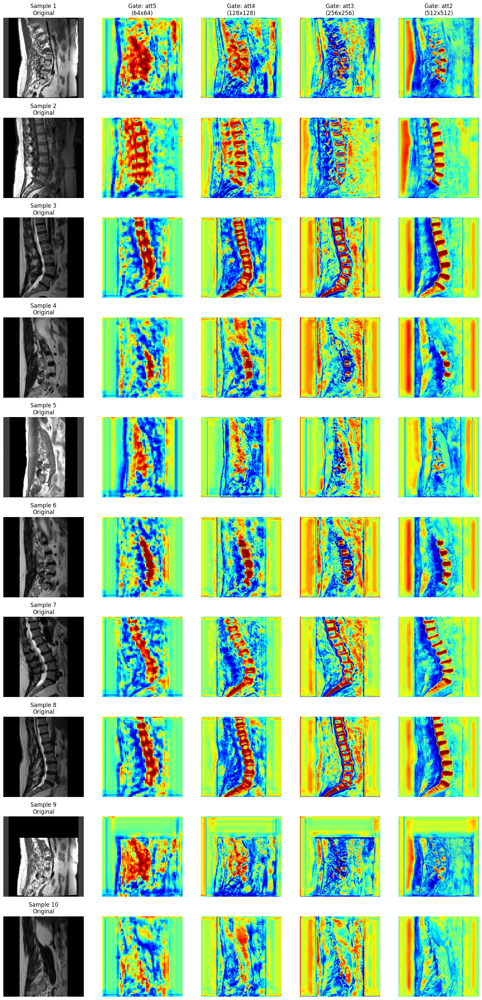

Hooks removed.


In [30]:
# ================================
# PRZYKŁAD UŻYCIA
# ================================

# 1. Załaduj swój model ImprovedAttentionUNet
model = ImprovedAttentionUNet(img_ch=1, output_ch=3).to(device)
model.load_state_dict(torch.load("trained_3d_models/best_paper_model.pth"))

# 2. Wywołaj wizualizację
visualize_unet_attention_gates_grid(
    model=model, 
    test_loader=test_loader, 
    device=device, 
    num_samples=10
)